In [ ]:
# 版权所有 2025 Google LLC
#
# 根据 Apache 许可证 2.0 版（“许可证”）的规定获得许可；
# 您不得使用此文件，除非符合许可证。
# 您可以在以下网址获取许可证副本：
#
#     https://www.apache.org/licenses/LICENSE-2.0
#
# 除非适用法律要求或经书面同意，否则根据许可证分发的软件
# 按“原样”提供，不附带任何明示或暗示的保证或条件。
# 请参阅许可证以了解特定语言的管理权限和
# 限制。

# Vertex AI 上的 Gemini 3 Pro 图像（纳米香蕉专业版 🍌）生成

<table align="left">
  <td style="text-align: center">
    <a href="https://colab.research.google.com/github/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_3_image_gen.ipynb">
      <img width="32px" src="https://www.gstatic.com/pantheon/images/bigquery/welcome_page/colab-logo.svg" alt="Google Colaboratory logo"><br> 在 Colab 中打开
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/colab/import/https:%2F%2Fraw.githubusercontent.com%2FGoogleCloudPlatform%2Fgenerative-ai%2Fmain%2Fgemini%2Fgetting-started%2Fintro_gemini_3_image_gen.ipynb">
      <img width="32px" src="https://lh3.googleusercontent.com/JmcxdQi-qOpctIvWKgPtrzZdJJK-J3sWE1RsfjZNwshCFgE_9fULcNpuXYTilIR2hjwN" alt="Google Cloud Colab Enterprise logo"><br> 在 Colab Enterprise 中打开
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://console.cloud.google.com/vertex-ai/workbench/deploy-notebook?download_url=https://raw.githubusercontent.com/GoogleCloudPlatform/generative-ai/main/gemini/getting-started/intro_gemini_3_image_gen.ipynb">
      <img src="https://www.gstatic.com/images/branding/gcpiconscolors/vertexai/v1/32px.svg" alt="Vertex AI logo"><br> 在 Vertex AI Workbench 中打开
    </a>
  </td>
  <td style="text-align: center">
    <a href="https://github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_3_image_gen.ipynb">
      <img width="32px" src="https://raw.githubusercontent.com/primer/octicons/refs/heads/main/icons/mark-github-24.svg" alt="GitHub logo"><br> 在 GitHub 上查看
    </a>
  </td>
</table>

<div style="clear: both;"></div>

<b>分享至:</b>

<a href="https://www.linkedin.com/sharing/share-offsite/?url=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_3_image_gen.ipynb" target="_blank">
  <img width="20px" src="https://upload.wikimedia.org/wikipedia/commons/8/81/LinkedIn_icon.svg" alt="LinkedIn logo">
</a>

<a href="https://bsky.app/intent/compose?text=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_3_image_gen.ipynb" target="_blank">
  <img width="20px" src="https://upload.wikimedia.org/wikipedia/commons/7/7a/Bluesky_Logo.svg" alt="Bluesky logo">
</a>

<a href="https://twitter.com/intent/tweet?url=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_3_image_gen.ipynb" target="_blank">
  <img width="20px" src="https://upload.wikimedia.org/wikipedia/commons/5/5a/X_icon_2.svg" alt="X logo">
</a>

<a href="https://reddit.com/submit?url=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_3_image_gen.ipynb" target="_blank">
  <img width="20px" src="https://redditinc.com/hubfs/Reddit%20Inc/Brand/Reddit_Logo.png" alt="Reddit logo">
</a>

<a href="https://www.facebook.com/sharer/sharer.php?u=https%3A//github.com/GoogleCloudPlatform/generative-ai/blob/main/gemini/getting-started/intro_gemini_3_image_gen.ipynb" target="_blank">
  <img width="20px" src="https://upload.wikimedia.org/wikipedia/commons/5/51/Facebook_f_logo_%282019%29.svg" alt="Facebook logo">
</a>

| 作者 |
| --- |
| [Katie Nguyen](https://github.com/katiemn) |

## 概述

本笔记本将向您展示如何使用纳米香蕉专业版图像模型。该模型是一个强大的、通用的多模态模型，提供最先进的图像生成和会话图像编辑功能。纳米香蕉专业版还能够展示其工作，让您看到生成输出背后的“思考过程”。

在本教程中，您将学习如何使用 Google Gen AI SDK 在 Vertex AI 中使用该模型，以尝试以下场景：

- 图像生成：
  - 文本到图像生成
  - 模型思考过程
  - 基于搜索结果的生成
  - 图像尺寸
- 图像编辑：
  - 本地化
  - 多轮图像编辑（聊天）
  - 使用多个参考图像进行编辑

**注意：** 与 Gemini 2.5 Flash 图像（纳米香蕉）相比，使用此模型时，由于其更高级的功能，预计会有更高的延迟。

## 开始

### 为 Python 安装 Google Gen AI SDK


In [1]:
%pip install --upgrade --quiet google-genai

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.3/53.3 kB 2.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 713.3/713.3 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 234.9/234.9 kB 8.7 MB/s eta 0:00:00
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires google-auth==2.43.0, but you have google-auth 2.47.0 which is incompatible.


### 认证您的笔记本环境（仅限 Colab）

如果您正在 Google Colab 上运行此笔记本，请运行以下单元格以认证您的环境。

In [2]:
import sys

if "google.colab" in sys.modules:
    from google.colab import auth

    auth.authenticate_user()

### 导入库

In [3]:
from IPython.display import Image, Markdown, display
from google import genai
from google.genai import types

import warnings
warnings.filterwarnings("ignore")

### 设置 Google Cloud 项目信息并创建客户端

要开始使用 Vertex AI，您必须拥有一个现有的 Google Cloud 项目并[启用 Vertex AI API](https://console.cloud.google.com/flows/enableapi?apiid=aiplatform.googleapis.com)。

了解更多关于[设置项目和开发环境](https://cloud.google.com/vertex-ai/docs/start/cloud-environment)的信息。

In [4]:
import os

PROJECT_ID = ""  # @param {type: "string", placeholder: "[您的项目ID]", isTemplate: true}
if not PROJECT_ID or PROJECT_ID == "[您的项目ID]":
    PROJECT_ID = str(os.environ.get("GOOGLE_CLOUD_PROJECT"))

LOCATION = "global"

client = genai.Client(vertexai=True, project=PROJECT_ID, location=LOCATION)

### 加载模型

In [5]:
MODEL_ID = "gemini-3-pro-image-preview"

## 图像生成

### 文本到图像

在下面的单元格中，您将调用 `generate_content` 方法并修改以下参数：

  - `prompt`：仅包含文本的用户消息，描述要生成的图像。
  - `config`：用于指定内容设置的配置。
    - `response_modalities`：要生成图像，您必须在 `response_modalities` 列表中包含 `IMAGE`。要同时获取文本和图像，请指定 `IMAGE` 和 `TEXT`。
    - `ImageConfig`：设置 `aspect_ratio`。有效比例为：1:1, 3:2, 2:3, 3:4, 4:3, 4:5, 5:4, 9:16, 16:9, 21:9

所有生成的图像都包含一个 [SynthID 水印](https://deepmind.google/technologies/synthid/)，可以通过 [Vertex AI Studio](https://cloud.google.com/generative-ai-studio?hl=en) 中的 Media Studio 进行验证。

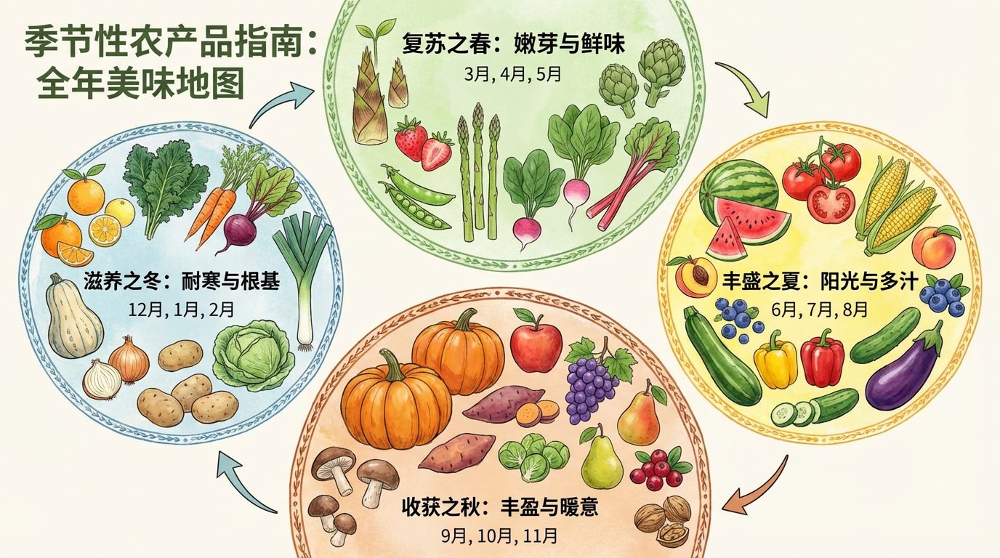

In [6]:
prompt = """
生成一份季节性农产品指南信息图。包括月份和每个季节有趣的类别名称，以及农产品的详细插图。
"""
response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=['IMAGE', 'TEXT'],
        image_config=types.ImageConfig(
            aspect_ratio="16:9",
        ),
    ),
)

# 如果未生成图像，则检查错误
if response.candidates[0].finish_reason != types.FinishReason.STOP:
    reason = response.candidates[0].finish_reason
    raise ValueError(f"提示内容错误: {reason}")

for part in response.candidates[0].content.parts:
    if part.thought:
        continue # 跳过显示思考过程
    if part.inline_data:
        display(Image(data=part.inline_data.data, width=1000))

### 查看思考过程

这是一个思考模型，您可以查看生成图像的思考过程。

In [7]:
for part in response.parts:
  if part.thought:
    if part.text:
      display(Markdown(part.text))
    elif part.inline_data:
      display(Image(data=part.inline_data.data, width=500))

**Planning the Infographic Design**

I'm currently focused on structuring the infographic. I've decided to use a cyclical layout, representing the year through the four seasons. I'm exploring creative season titles to enhance visual appeal.




**Mapping Seasonal Harvests**

I'm now prioritizing the visual elements. The concept involves a circular design, with four distinct sections for each season, and I'm developing a color scheme to differentiate them. I'm focusing on illustrative representations of the fruits and vegetables.




**Generating Seasonal Guidance**

I've successfully created an infographic on seasonal agricultural products. I've used a cyclical layout representing the four seasons, each with a creative title and corresponding months. I've also incorporated detailed illustrations of seasonal produce.




**Creating a Visual Aid**

I'm developing a user-friendly infographic. It showcases seasonal agricultural products. The design uses a circular layout, creatively titling each season and including monthly markers. I'm adding detailed illustrations of relevant produce.




### 基于搜索结果的生成

使用此模型，您还可以生成基于 Google 搜索结果的内容。请注意，该模型仅基于文本结果，而不基于 Google 搜索中可找到的图像进行生成。

要显示基于搜索结果的数据，请使用以下单元格中的辅助函数。

In [8]:
def print_grounding_data(response: types.GenerateContentResponse) -> None:
    """以 Markdown 格式打印带有引用源的 Gemini 响应。"""
    grounding_metadata = response.candidates[0].grounding_metadata
    lines = []

    if response.text:
        # 引用索引以字节为单位
        ENCODING = "utf-8"
        text_bytes = response.text.encode(ENCODING)
        last_byte_index = 0

        if grounding_metadata.grounding_supports:
            for support in grounding_metadata.grounding_supports:
                lines.append(
                    text_bytes[last_byte_index : support.segment.end_index].decode(ENCODING)
                )

                # 生成并添加引用脚注（例如，“[1][2]”）
                footnotes = "".join([f"[{i + 1}]" for i in support.grounding_chunk_indices])
                lines.append(f" {footnotes}")

                # 更新下一个段的索引
                last_byte_index = support.segment.end_index

        # 添加最后一个引用后剩余的任何文本
        if last_byte_index < len(text_bytes):
            lines.append(text_bytes[last_byte_index:].decode(ENCODING))

    lines.append("\n\n----\n## 引用来源\n")

    if grounding_metadata.grounding_chunks:
        # 构建引用来源部分
        lines.append("### 引用块\n")
        for i, chunk in enumerate(grounding_metadata.grounding_chunks, start=1):
            context = chunk.web or chunk.retrieved_context or chunk.maps
            if not context:
                continue

            uri = context.uri
            title = context.title or "来源"

            # 将 GCS URI 转换为公共 HTTPS URL
            if uri:
                uri = uri.replace(" ", "%20")
                if uri.startswith("gs://"):
                    uri = uri.replace(
                        "gs://", "https://storage.googleapis.com/", 1
                    )

            lines.append(f"{i}. [{title}]({uri})\n")
            if hasattr(context, "place_id") and context.place_id:
                lines.append(f"    - 地点 ID: `{context.place_id}`\n\n")
            if hasattr(context, "text") and context.text:
                lines.append(f"{context.text}\n\n")

    # 添加搜索/检索查询
    if grounding_metadata.web_search_queries:
        lines.append(
            f"\n**网络搜索查询:** {grounding_metadata.web_search_queries}\n"
        )
        if grounding_metadata.search_entry_point:
            lines.append(
                f"\n**搜索入口点:**\n{grounding_metadata.search_entry_point.rendered_content}\n"
            )
    elif grounding_metadata.retrieval_queries:
        lines.append(
            f"\n**检索查询:** {grounding_metadata.retrieval_queries}\n"
        )

    display(Markdown("".join(lines)))

接下来，您将创建一个 Google Search 工具并将其包含在以下请求的 `tools` 参数中。

**Analyzing the Weather Data**

I'm gathering the necessary weather data from San Francisco, focusing on temperature and conditions for the next five days. I'm moving toward organizing this information into a usable format for the graphic. My current focus is on extracting the essential data points.




**Constructing the Forecast**

I'm currently building a 5-day weather forecast for San Francisco, using data on temperature, cloud cover, and precipitation chances. The plan is to present this data as a modern infographic, divided into five daily panels. Each panel will display weather icons and clothing recommendations.




**Developing the Layout**

I am now focusing on the infographic's structure. Five panels will be arranged horizontally, each detailing a day's weather. Each panel will have the day and date, along with weather icons, temperature highs and lows, and outfit suggestions. The color scheme is set: blue and gold.




**Reviewing Image Compliance**

I'm checking that the generated image satisfies the user's requirements. It appears to accurately reflect the 5-day weather forecast for San Francisco, using an infographic design. The provided data has been correctly utilized, and the clothing suggestions seem reasonable.




**Validating the Visuals**

I've examined the visual layout and content of the graphic. The provided data is accurately represented. The infographic uses a clear design, and the clothing suggestions align with the forecast. I will prepare this for delivery.




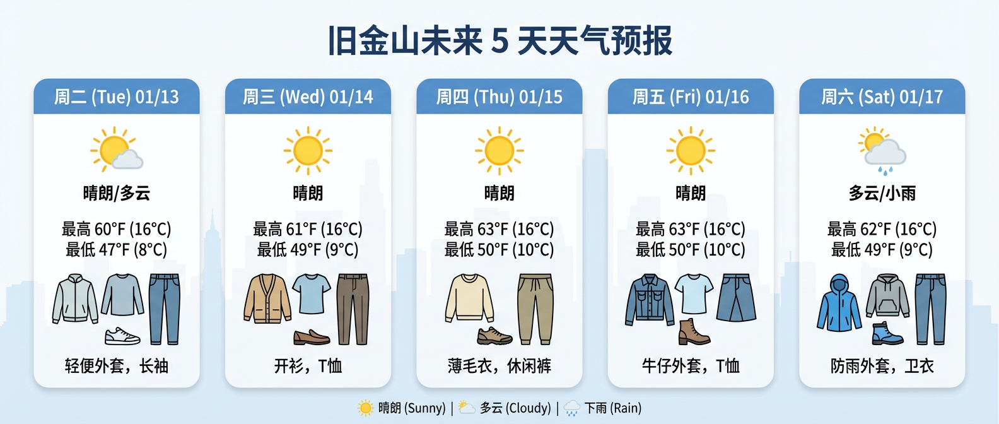



----
## 引用来源
### 引用块
1. [Current time information in San Francisco, CA, US.](https://www.google.com/search?q=time+in+San+Francisco,+CA,+US)
2. [Weather information for San Francisco, CA, US](https://www.google.com/search?q=weather+in+San%20Francisco,%20CA,+US)
3. [localconditions.com](https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQEzN4Qkp_i6BakfY3B4Wgz4IpCkJ9C0KEccXvujSz8Q79jgQqDVSLEPDeUXwZavW0B83ALKXLZUNaXRPkCiro0qNh0Nxa0TqVmHrgBzArd9EVyxdd6m0b2ccECvhZDELD2ylqKQGYQuVyBeYz7QYSPPMSZ08lp7tx0k7DE7kxg9dmvyG2CTeNZpSks2ah-I)

**网络搜索查询:** ['San Francisco 5-day weather forecast']

**搜索入口点:**
<style>
.container {
  align-items: center;
  border-radius: 8px;
  display: flex;
  font-family: Google Sans, Roboto, sans-serif;
  font-size: 14px;
  line-height: 20px;
  padding: 8px 12px;
}
.chip {
  display: inline-block;
  border: solid 1px;
  border-radius: 16px;
  min-width: 14px;
  padding: 5px 16px;
  text-align: center;
  user-select: none;
  margin: 0 8px;
  -webkit-tap-highlight-color: transparent;
}
.carousel {
  overflow: auto;
  scrollbar-width: none;
  white-space: nowrap;
  margin-right: -12px;
}
.headline {
  display: flex;
  margin-right: 4px;
}
.gradient-container {
  position: relative;
}
.gradient {
  position: absolute;
  transform: translate(3px, -9px);
  height: 36px;
  width: 9px;
}
@media (prefers-color-scheme: light) {
  .container {
    background-color: #fafafa;
    box-shadow: 0 0 0 1px #0000000f;
  }
  .headline-label {
    color: #1f1f1f;
  }
  .chip {
    background-color: #ffffff;
    border-color: #d2d2d2;
    color: #5e5e5e;
    text-decoration: none;
  }
  .chip:hover {
    background-color: #f2f2f2;
  }
  .chip:focus {
    background-color: #f2f2f2;
  }
  .chip:active {
    background-color: #d8d8d8;
    border-color: #b6b6b6;
  }
  .logo-dark {
    display: none;
  }
  .gradient {
    background: linear-gradient(90deg, #fafafa 15%, #fafafa00 100%);
  }
}
@media (prefers-color-scheme: dark) {
  .container {
    background-color: #1f1f1f;
    box-shadow: 0 0 0 1px #ffffff26;
  }
  .headline-label {
    color: #fff;
  }
  .chip {
    background-color: #2c2c2c;
    border-color: #3c4043;
    color: #fff;
    text-decoration: none;
  }
  .chip:hover {
    background-color: #353536;
  }
  .chip:focus {
    background-color: #353536;
  }
  .chip:active {
    background-color: #464849;
    border-color: #53575b;
  }
  .logo-light {
    display: none;
  }
  .gradient {
    background: linear-gradient(90deg, #1f1f1f 15%, #1f1f1f00 100%);
  }
}
</style>
<div class="container">
  <div class="headline">
    <svg class="logo-light" width="18" height="18" viewBox="9 9 35 35" fill="none" xmlns="http://www.w3.org/2000/svg">
      <path fill-rule="evenodd" clip-rule="evenodd" d="M42.8622 27.0064C42.8622 25.7839 42.7525 24.6084 42.5487 23.4799H26.3109V30.1568H35.5897C35.1821 32.3041 33.9596 34.1222 32.1258 35.3448V39.6864H37.7213C40.9814 36.677 42.8622 32.2571 42.8622 27.0064V27.0064Z" fill="#4285F4"/>
      <path fill-rule="evenodd" clip-rule="evenodd" d="M26.3109 43.8555C30.9659 43.8555 34.8687 42.3195 37.7213 39.6863L32.1258 35.3447C30.5898 36.3792 28.6306 37.0061 26.3109 37.0061C21.8282 37.0061 18.0195 33.9811 16.6559 29.906H10.9194V34.3573C13.7563 39.9841 19.5712 43.8555 26.3109 43.8555V43.8555Z" fill="#34A853"/>
      <path fill-rule="evenodd" clip-rule="evenodd" d="M16.6559 29.8904C16.3111 28.8559 16.1074 27.7588 16.1074 26.6146C16.1074 25.4704 16.3111 24.3733 16.6559 23.3388V18.8875H10.9194C9.74388 21.2072 9.06992 23.8247 9.06992 26.6146C9.06992 29.4045 9.74388 32.022 10.9194 34.3417L15.3864 30.8621L16.6559 29.8904V29.8904Z" fill="#FBBC05"/>
      <path fill-rule="evenodd" clip-rule="evenodd" d="M26.3109 16.2386C28.85 16.2386 31.107 17.1164 32.9095 18.8091L37.8466 13.8719C34.853 11.082 30.9659 9.3736 26.3109 9.3736C19.5712 9.3736 13.7563 13.245 10.9194 18.8875L16.6559 23.3388C18.0195 19.2636 21.8282 16.2386 26.3109 16.2386V16.2386Z" fill="#EA4335"/>
    </svg>
    <svg class="logo-dark" width="18" height="18" viewBox="0 0 48 48" xmlns="http://www.w3.org/2000/svg">
      <circle cx="24" cy="23" fill="#FFF" r="22"/>
      <path d="M33.76 34.26c2.75-2.56 4.49-6.37 4.49-11.26 0-.89-.08-1.84-.29-3H24.01v5.99h8.03c-.4 2.02-1.5 3.56-3.07 4.56v.75l3.91 2.97h.88z" fill="#4285F4"/>
      <path d="M15.58 25.77A8.845 8.845 0 0 0 24 31.86c1.92 0 3.62-.46 4.97-1.31l4.79 3.71C31.14 36.7 27.65 38 24 38c-5.93 0-11.01-3.4-13.45-8.36l.17-1.01 4.06-2.85h.8z" fill="#34A853"/>
      <path d="M15.59 20.21a8.864 8.864 0 0 0 0 5.58l-5.03 3.86c-.98-2-1.53-4.25-1.53-6.64 0-2.39.55-4.64 1.53-6.64l1-.22 3.81 2.98.22 1.08z" fill="#FBBC05"/>
      <path d="M24 14.14c2.11 0 4.02.75 5.52 1.98l4.36-4.36C31.22 9.43 27.81 8 24 8c-5.93 0-11.01 3.4-13.45 8.36l5.03 3.85A8.86 8.86 0 0 1 24 14.14z" fill="#EA4335"/>
    </svg>
    <div class="gradient-container"><div class="gradient"></div></div>
  </div>
  <div class="carousel">
    <a class="chip" href="https://vertexaisearch.cloud.google.com/grounding-api-redirect/AUZIYQH2W_JmX5Ds4-uZpqoXxN9SUiG2QjtKEaKA31EUBHDDtNa4GxSPhG_SJznRynTXN50QCNCbWTTBRW7dK-vqNtC0M3mGeKMNG8s-0Ld9zMWoyStJWsfY2bHQ3Qt7RfTj1Ov5TAFDTOR26QTPGyDsjJmkBa7K0yG7eA3Mp3jt4vOrx-TUV3gxTRps4W5eoumAGGsQi5XIDNQg18GJYcrRmIDFxtFVbnkHdA==">San Francisco 5-day weather forecast</a>
  </div>
</div>



In [9]:
prompt = """
搜索并可视化旧金山未来 5 天的天气预报，以简洁、现代的天气图呈现。添加每天可以穿的服装的视觉效果。
"""
google_search = types.Tool(google_search=types.GoogleSearch())

response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=['TEXT', 'IMAGE'],
        image_config=types.ImageConfig(
            aspect_ratio="21:9",
        ),
        tools=[google_search],
    )
)

for part in response.parts:
    if part.text and part.thought:
      display(Markdown(part.text))
    elif part.inline_data:
      display(Image(data=part.inline_data.data, width=500))

print_grounding_data(response)

### 图像尺寸

纳米香蕉专业版支持以下图像尺寸：`1K`、`2K` 或 `4K`。


In [10]:
prompt = """
生成一张人物的特写头像。
"""

response = client.models.generate_content(
    model=MODEL_ID,
    contents=prompt,
    config=types.GenerateContentConfig(
        response_modalities=['TEXT', 'IMAGE'],
        image_config=types.ImageConfig(
            aspect_ratio="1:1",
            image_size="2K",
        ),
    )
)

for part in response.candidates[0].content.parts:
    if part.text:
        display(Markdown(part.text))
    if part.inline_data:
        display(Image(data=part.inline_data.data, width=500))

Output hidden; open in https://colab.research.google.com to view.

## 图像编辑

您也可以使用此模型编辑图像，只需将原始图像作为提示的一部分传递即可。

### 本地化

您还可以通过图像编辑来翻译图像中的文本。首先下载图像并在下方显示。

--2026-01-13 08:10:10--  https://storage.googleapis.com/cloud-samples-data/generative-ai/image/flying-sneakers.png
Resolving storage.googleapis.com (storage.googleapis.com)... 173.194.195.207, 172.217.214.207, 108.177.121.207, ...
Connecting to storage.googleapis.com (storage.googleapis.com)|173.194.195.207|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 865129 (845K) [image/png]
Saving to: ‘flying-sneakers.png’

flying-sneakers.png 100%[===================>] 844.85K  --.-KB/s    in 0.01s   

2026-01-13 08:10:10 (60.8 MB/s) - ‘flying-sneakers.png’ saved [865129/865129]



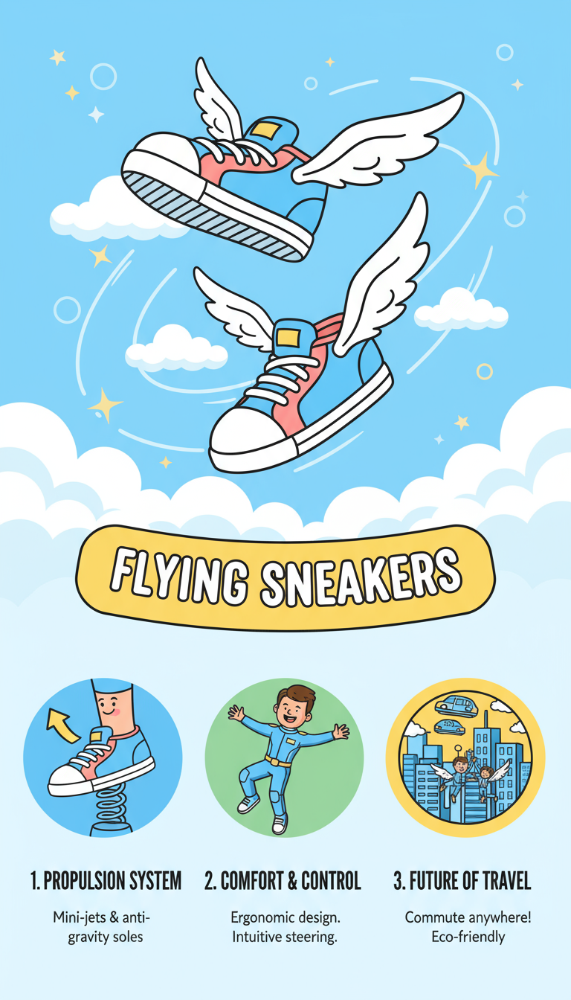

In [11]:
!wget https://storage.googleapis.com/cloud-samples-data/generative-ai/image/flying-sneakers.png

starting_image = "flying-sneakers.png"
display(Image(filename=starting_image, width=500))

**Analyzing Translations**

\n\n

I'm focused on translating text from an infographic. The primary title "FLYING SNEAKERS" is straightforward and renders as "ZAPATILLAS VOLADORAS". Next, I'll translate the first item title and description.




**Evaluating the Spanish Conversion**

\n\n

My current effort involves translating the infographic's English text into Spanish. I successfully translated the title, "FLYING SNEAKERS," to "ZAPATILLAS VOLADORAS". Now, I'm working through the item titles and descriptions, moving on to the second item after completing the first.




**Analyzing Translations**

I'm checking the Spanish translations in the generated image. The titles, bullet points, and descriptions appear to be accurately translated and integrated into the original layout. I am looking carefully for any errors in spelling or formatting.




**Evaluating Accuracy**

I'm focused on the Spanish translations of the English text. It seems all content has been accurately translated, including titles, bullet points, and descriptions. Everything appears to fit well within the original layout, and I'm not seeing any spelling or formatting issues.




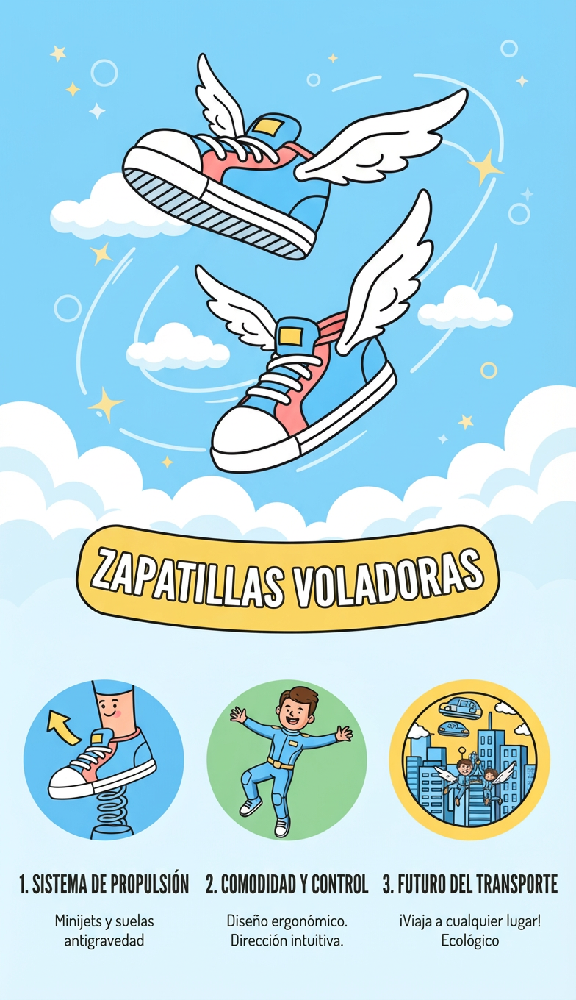

In [12]:
with open(starting_image, "rb") as f:
    image = f.read()

response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        types.Part.from_bytes(
            data=image,
            mime_type="image/png",
        ),
        "将此信息图中的文本从英文更改为西班牙文。",
    ],
    config=types.GenerateContentConfig(
        response_modalities=['TEXT', 'IMAGE'],
        image_config=types.ImageConfig(
            image_size="1K",
        ),
    )
)

for part in response.candidates[0].content.parts:
    if part.text:
        display(Markdown(part.text))
    if part.inline_data:
        display(Image(data=part.inline_data.data, width=500))

### 多轮图像编辑（聊天）

在下一节中，您将生成一个起始图像，并通过与模型聊天来迭代地更改图像的某些方面。

**Describing the Scene**

I am now focusing on the details of the perfume bottle, its design, the contents, and how it interacts with the other elements. I'm considering the textures of the vanity and the arrangement of objects to build the scene's atmosphere. I'm also carefully considering the natural light and the vintage feel.




**Reflecting on Composition**

I'm currently focused on the interplay of elements. I've been experimenting with ways to make the design of the perfume bottle the focal point, while still incorporating the details from the antique dressing table. The goal is to build a rich, inviting atmosphere.




**Synthesizing Visual Elements**

I've integrated the transparent perfume bottle into the scene. It sits atop the antique dressing table. I then added natural light and a window view, and props such as brushes and flowers. My aim is to create a warm and nostalgic atmosphere.




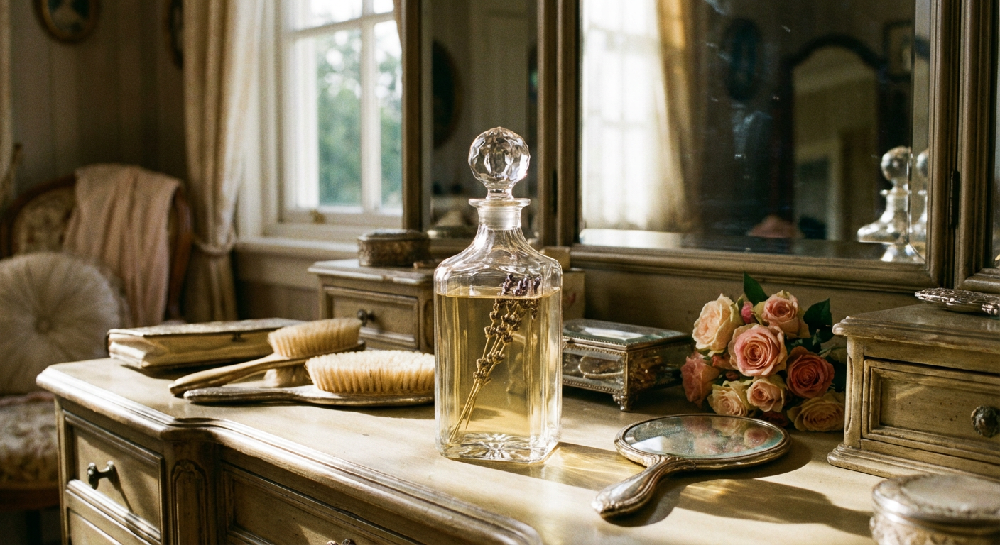

In [13]:
chat = client.chats.create(
    model=MODEL_ID,
    config=types.GenerateContentConfig(
        response_modalities=['TEXT', 'IMAGE']
    )
)

message = "创建一张透明香水瓶放在梳妆台上的图片。"
response = chat.send_message(message)

# 保存图像数据，以便在下一次聊天消息中传递
data = b''
for part in response.candidates[0].content.parts:
    if part.text:
        display(Markdown(part.text))
    if part.inline_data:
        data = part.inline_data.data
        display(Image(data=data, width=500))

现在，您将在现有聊天的消息中包含先前的图像数据，以及一个新的文本提示，以更新先前生成的图像。

**Focusing on Alterations**

I'm now zeroing in on the image modifications. The plan is to shift the central perfume bottle and its contents to a vibrant purple. I'm also planning to incorporate a sizable vase filled with pink and blue hydrangeas to the right, to complement the existing rose bouquet.




**Implementing the Adjustments**

I'm working on the adjustments now. The main bottle's color is changing to a deep purple. I'm introducing the vase filled with hydrangeas to the composition, focusing on the placement and color of the blossoms. I'm paying close attention to the interplay of light and shadow across all the elements.




**Analyzing Image Fidelity**

My focus remains on validating the image's adherence to the prompt. I am verifying that the generated purple perfume bottle is alongside the specified colorful hydrangeas. The transformation of the perfume and the presence of the flowers are both under scrutiny.




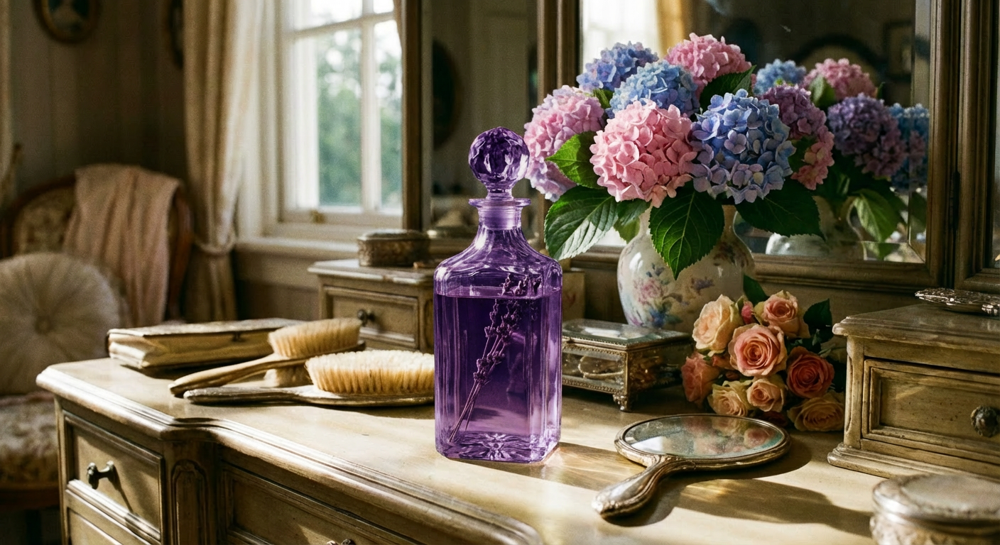

In [14]:
response = chat.send_message(
    message=[
        types.Part.from_bytes(
            data=data,
            mime_type="image/png",
        ),
        "将香水瓶改成紫色，并在瓶子旁边添加一瓶绣球花。",
    ],
)

for part in response.candidates[0].content.parts:
    if part.text:
        display(Markdown(part.text))
    if part.inline_data:
        display(Image(data=part.inline_data.data, width=500))

### 多个参考图像

使用纳米香蕉专业版，您可以在请求中包含多个参考图像，以生成一个保留原始图像内容的新图像。

运行以下单元格以可视化存储在 Cloud Storage 中的起始图像。

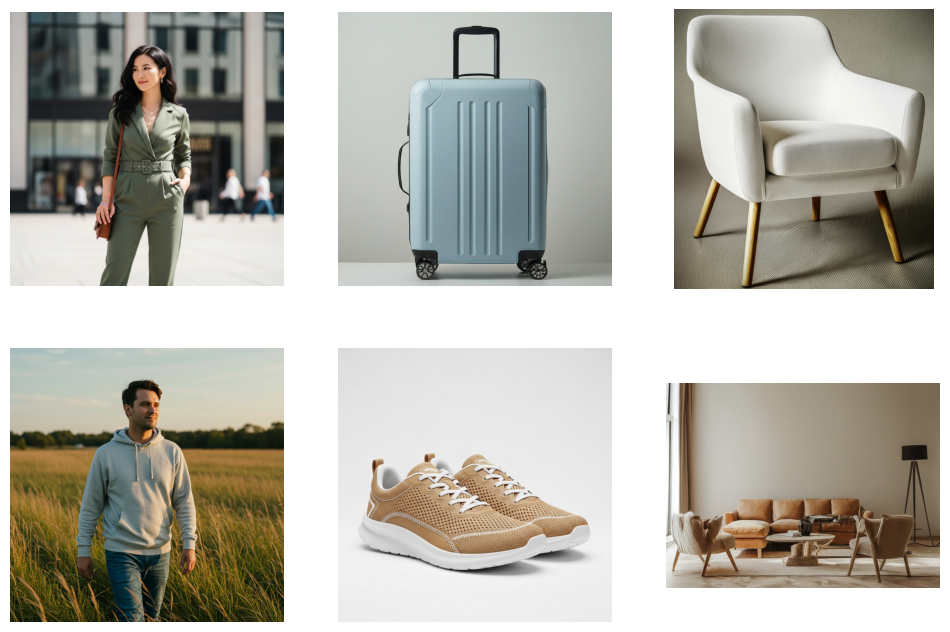

In [15]:
import requests
from PIL import Image as PIL_Image
from io import BytesIO
import matplotlib.pyplot as plt

image_urls = [
    "https://storage.googleapis.com/cloud-samples-data/generative-ai/image/woman.jpg",
    "https://storage.googleapis.com/cloud-samples-data/generative-ai/image/suitcase.png",
    "https://storage.googleapis.com/cloud-samples-data/generative-ai/image/armchair.png",
    "https://storage.googleapis.com/cloud-samples-data/generative-ai/image/man-in-field.png",
    "https://storage.googleapis.com/cloud-samples-data/generative-ai/image/shoes.jpg",
    "https://storage.googleapis.com/cloud-samples-data/generative-ai/image/living-room.png",
]

fig, axes = plt.subplots(2, 3, figsize=(12, 8))
for i, ax in enumerate(axes.flatten()):
    ax.imshow(PIL_Image.open(BytesIO(requests.get(image_urls[i]).content)))
    ax.axis("off")
plt.show()

发送请求的过程与之前的图像编辑调用类似。主要区别在于您将提供多个 `Part.from_uri` 实例，每个参考图像一个。

**Imagining a Scene**

I am now focusing on the scene in the living room. I'm visualizing the woman in a jumpsuit and brown sneakers, seated in a white armchair next to a blue suitcase. Beside her, I see the man in a hoodie, jeans, and matching brown sneakers. The setting's warmth and natural lighting are coming into focus.




**Composing the Details**

I am now building the scene piece by piece. The woman's olive green jumpsuit and the man's grey hoodie are clear. The white armchair and blue suitcase are defined in my mind, along with the warm natural lighting filtering through the large windows. The details of the wooden floor and beige walls are coming into view.




**Verifying the Composition**

I am currently evaluating the generated image. My primary focus is to determine if the details provided in the prompts are accurately and completely reflected in the visual representation. I am carefully assessing each element.




**Confirming the Details**

I'm verifying that the image adheres to all directives. The generated scene accurately portrays the specified individuals, clothing, sneakers, white armchair, blue suitcase, and living room setting. The scene feels natural, and the elements appear cohesive.




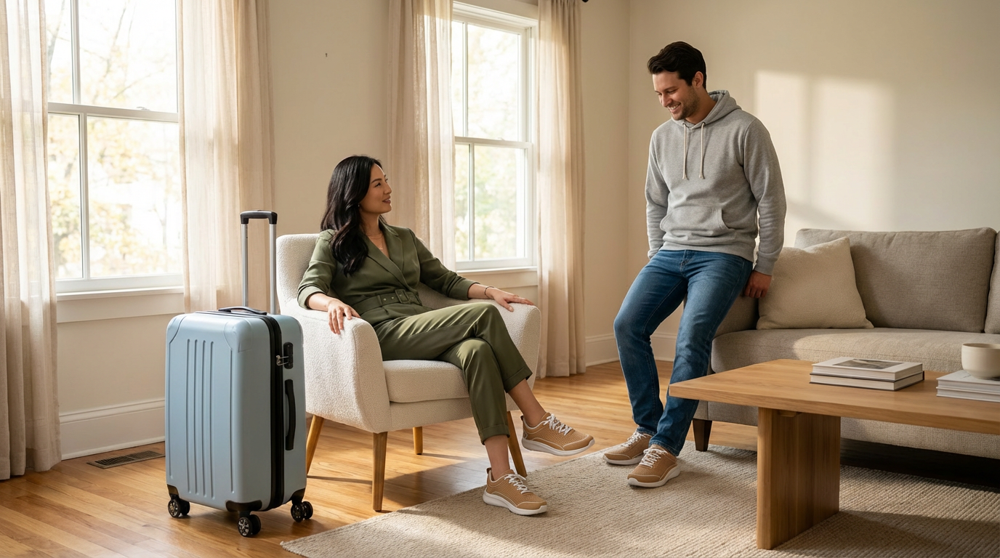

In [16]:
response = client.models.generate_content(
    model=MODEL_ID,
    contents=[
        types.Part.from_uri(
            file_uri="gs://cloud-samples-data/generative-ai/image/woman.jpg",
            mime_type="image/jpeg",
        ),
        types.Part.from_uri(
            file_uri="gs://cloud-samples-data/generative-ai/image/suitcase.png",
            mime_type="image/png",
        ),
        types.Part.from_uri(
            file_uri="gs://cloud-samples-data/generative-ai/image/armchair.png",
            mime_type="image/png",
        ),
        types.Part.from_uri(
            file_uri="gs://cloud-samples-data/generative-ai/image/man-in-field.png",
            mime_type="image/png",
        ),
        types.Part.from_uri(
            file_uri="gs://cloud-samples-data/generative-ai/image/shoes.jpg",
            mime_type="image/jpeg",
        ),
        types.Part.from_uri(
            file_uri="gs://cloud-samples-data/generative-ai/image/living-room.png",
            mime_type="image/png",
        ),
        "生成一张图片，一个女人坐在客厅里，旁边有一个男人，他们都穿着运动鞋。女人坐在一张白色扶手椅上，旁边放着一个蓝色行李箱。",
    ],
    config=types.GenerateContentConfig(
        response_modalities=["TEXT", "IMAGE"],
        image_config=types.ImageConfig(
            aspect_ratio="16:9",
        ),
    ),
)


for part in response.candidates[0].content.parts:
    if part.text:
        display(Markdown(part.text))
    if part.inline_data:
        display(Image(data=part.inline_data.data, width=500))